## read me

In [2]:
%matplotlib qt

import mne
from mne.preprocessing import ICA, corrmap, create_ecg_epochs, create_eog_epochs
import glob
import os
mne.set_log_level('ERROR')
from autoreject import AutoReject

In [9]:
paths = glob.glob('mmn/*')
paths = glob.glob('rest_baseline/*')
paths = glob.glob('control_resting_state/*')
paths.sort()

In [10]:
paths

['control_resting_state/sub0-control-mindfulness-raw.fif',
 'control_resting_state/sub1-control-mindfulness-raw.fif',
 'control_resting_state/sub10-control-mindfulness-raw.fif',
 'control_resting_state/sub11-control-mindfulness-raw.fif',
 'control_resting_state/sub12-control-mindfulness-raw.fif',
 'control_resting_state/sub2-control-mindfulness-raw.fif',
 'control_resting_state/sub3-control-mindfulness-raw.fif',
 'control_resting_state/sub4-control-mindfulness-raw.fif',
 'control_resting_state/sub5-control-mindfulness-raw.fif',
 'control_resting_state/sub6-control-mindfulness-raw.fif',
 'control_resting_state/sub7-control-mindfulness-raw.fif',
 'control_resting_state/sub8-control-mindfulness-raw.fif',
 'control_resting_state/sub9-control-mindfulness-raw.fif']

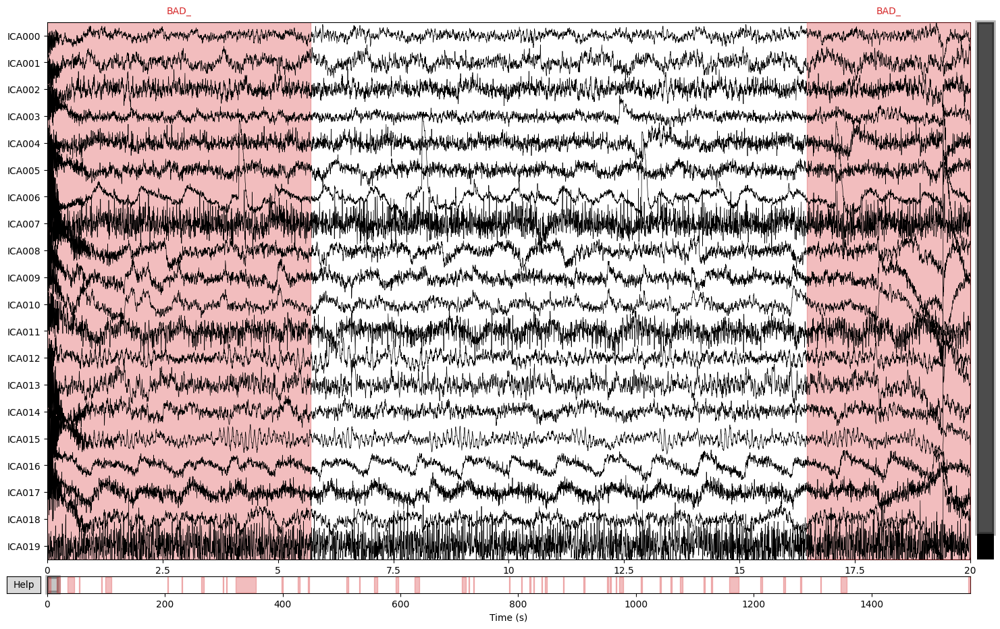

In [11]:
count = 12
path = paths[count]
basename = os.path.basename(path)
raw = mne.io.read_raw(path, preload=True)
montage = mne.channels.make_standard_montage('standard_1020')
raw.set_montage(montage)

raw.filter(l_freq=1.0, h_freq=None)

ica = ICA(n_components=20, method='infomax', max_iter="auto", random_state=97)
ica.fit(raw, reject_by_annotation=True)
ica.plot_components()
ica.plot_sources(raw)

# set components as high as possible

In [8]:
ica.plot_properties(raw,0)

[<Figure size 1400x1200 with 6 Axes>]

In [191]:
raw.save(export_folder + basename, overwrite=True)

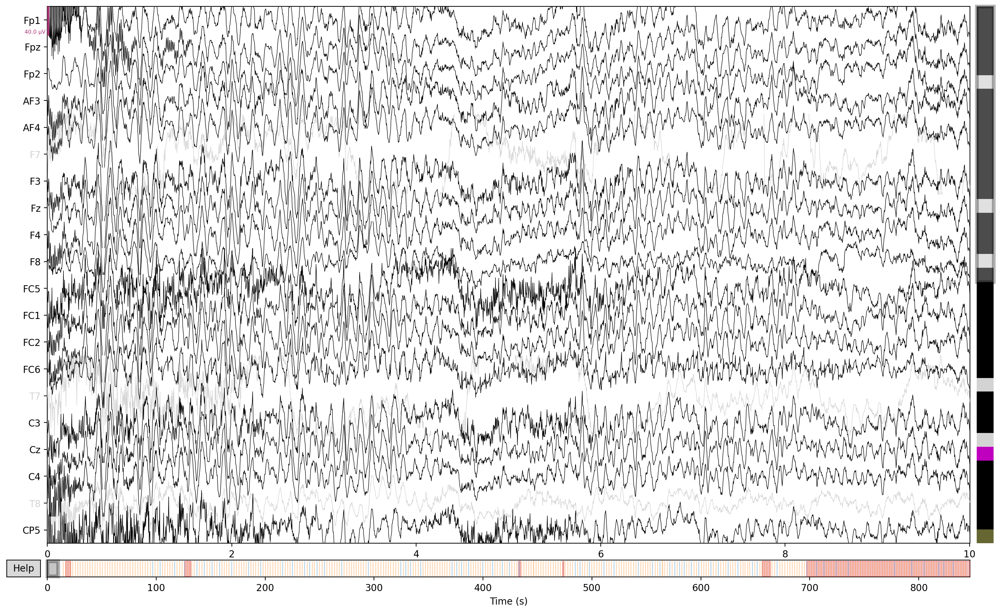

In [11]:
raw.plot()

In [23]:
path = "/Users/jonasmago/PhD_code_data/github/eeg_jhana/data/mne_raw/sub0-day1-jhana-raw.fif"
raw = mne.io.read_raw(path, preload=True)


In [30]:
montage = mne.channels.make_standard_montage('standard_1020')
raw.set_montage(montage)


raw.filter(0.3, 56)
raw.notch_filter(freqs=[44, 60, 76, 84, 120])
raw.notch_filter(freqs=60, notch_widths=1, phase='zero')
raw.notch_filter(freqs=83.5, notch_widths=1, phase='zero')    
#raw.notch_filter(freqs=79, notch_widths=1, phase='zero')

Measurement date,Unknown
Experimenter,Unknown
Participant,Unknown
Digitized points,35 points
Good channels,"32 EEG, 4 Stimulus, 1 ECG, 1 Respiration monitoring channel, 1 Galvanic skin response"
Bad channels,None
EOG channels,Not available
ECG channels,ecg_heart
Sampling frequency,256.00 Hz
Highpass,0.30 Hz
Lowpass,56.00 Hz


In [35]:
raw.filter(1.0, 56)

Measurement date,Unknown
Experimenter,Unknown
Participant,Unknown
Digitized points,35 points
Good channels,"31 EEG, 4 Stimulus, 1 ECG, 1 Respiration monitoring channel, 1 Galvanic skin response"
Bad channels,T8
EOG channels,Not available
ECG channels,ecg_heart
Sampling frequency,256.00 Hz
Highpass,1.00 Hz
Lowpass,56.00 Hz


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/mne/time_frequency/psd.py:266: UserWarning: nperseg = 2048 is greater than input length  = 11, using nperseg = 11
  return _func(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/mne/time_frequency/psd.py:266: UserWarning: nperseg = 2048 is greater than input length  = 1019, using nperseg = 1019
  return _func(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/mne/time_frequency/psd.py:266: UserWarning: nperseg = 2048 is greater than input length  = 278, using nperseg = 278
  return _func(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/mne/time_frequency/psd.py:266: UserWarning: nperseg = 2048 is greater than input length  = 446, using nperseg = 446
  return _func(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/mne/time

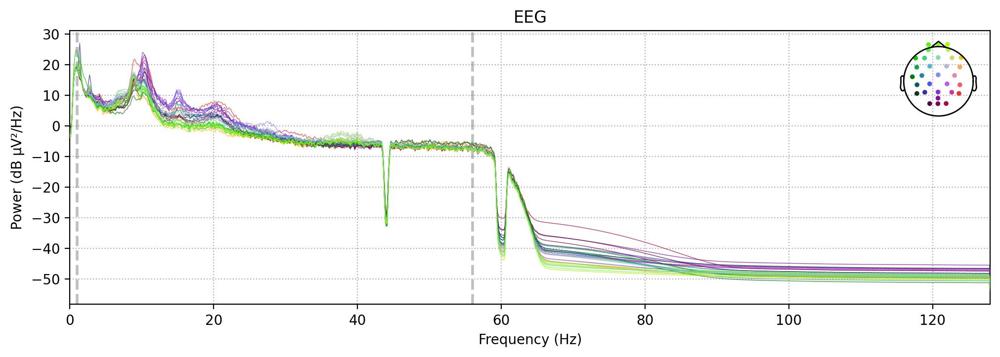

In [36]:
raw.plot_psd()

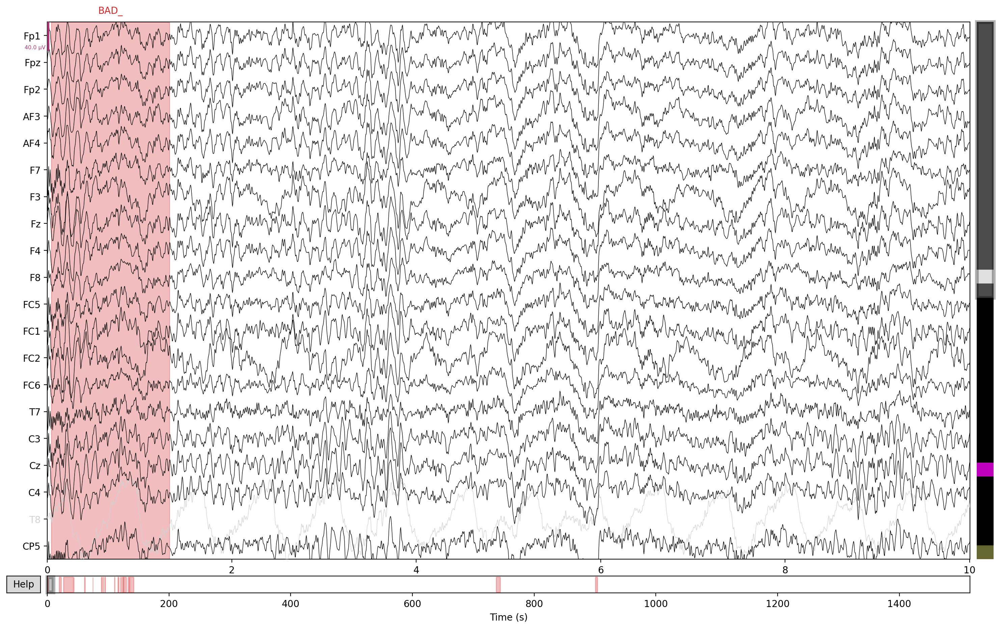

In [37]:
raw.plot()

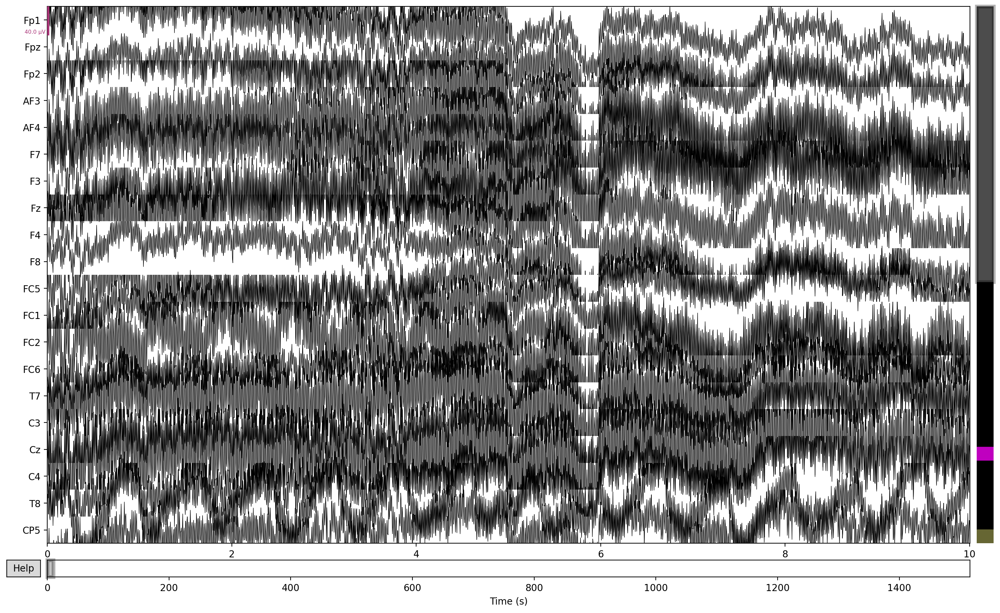

In [18]:
raw.plot()

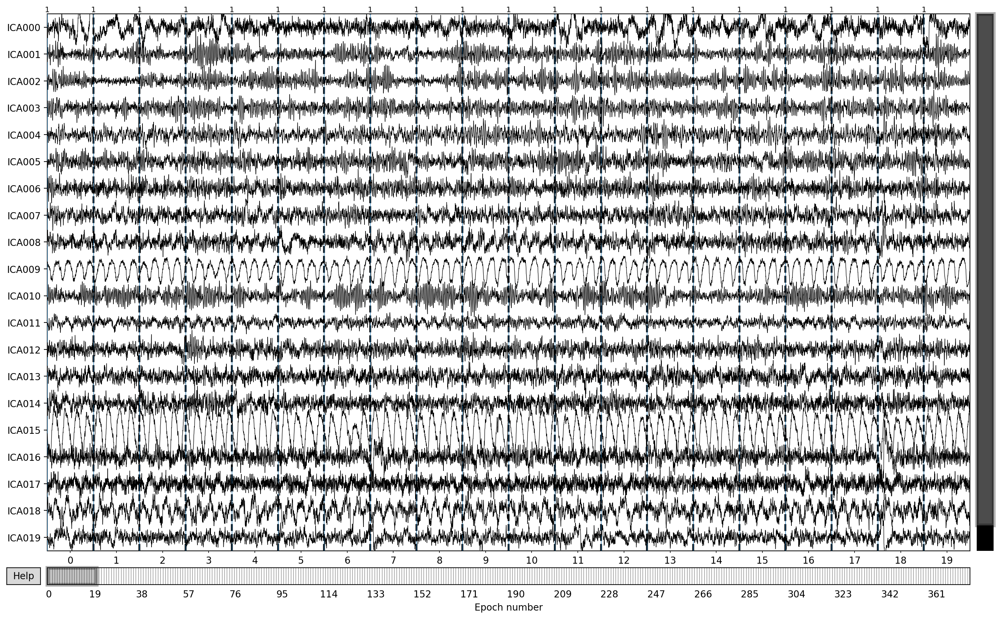

In [48]:
ica = ICA(n_components=20, method='infomax', max_iter="auto", random_state=97)
ica.fit(epochs, reject_by_annotation=True)
ica.plot_components()
ica.plot_sources(epochs)

In [42]:
ica.plot_properties(raw, picks=[11])

[<Figure size 1400x1200 with 6 Axes>]

In [44]:
epochs = mne.make_fixed_length_epochs(raw, 3)

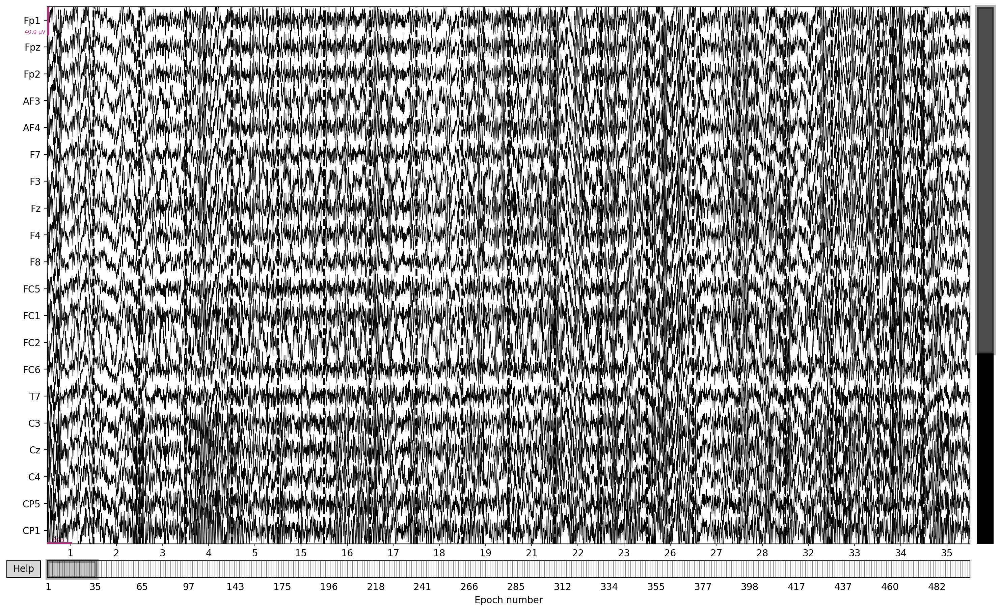

In [46]:
epochs.plot()

# Apply ICA to multiple sessions at once

In [10]:
import mne
from mne.preprocessing import ICA

raw0 = mne.io.read_raw(paths[0], preload=True)
raw1 = mne.io.read_raw(paths[1], preload=True)

# Check bad channels in each raw object
print("Bad channels in raw0:", raw0.info['bads'])
print("Bad channels in raw1:", raw1.info['bads'])

# Create a unified list of bad channels
all_bad_channels = list(set(raw0.info['bads']) | set(raw1.info['bads']))

# Assign the unified list of bad channels to each raw object
raw0.info['bads'] = all_bad_channels
raw1.info['bads'] = all_bad_channels

# Concatenate the raw objects
raw_combined = mne.concatenate_raws([raw0, raw1])

# Initialize ICA
ica = ICA(n_components=20, random_state=97, max_iter=800)

# Fit ICA on the concatenated raw data
ica.fit(raw_combined)

# Apply ICA to each raw object
raw0_ica = ica.apply(raw0.copy())
raw1_ica = ica.apply(raw1.copy())

# Optionally, save the ICA solution and the cleaned raw objects
ica.save('ica_solution.fif')
print("ICA applied successfully to raw0 and raw1.")


Bad channels in raw0: ['O2', 'P8']
Bad channels in raw1: []
ICA applied successfully to raw0 and raw1.


In [25]:
ica.fit(raw0, raw1)

ValueError: setting an array element with a sequence. The requested array has an inhomogeneous shape after 2 dimensions. The detected shape was (39, 2) + inhomogeneous part.

In [11]:
ica.plot()

AttributeError: 'ICA' object has no attribute 'plot'

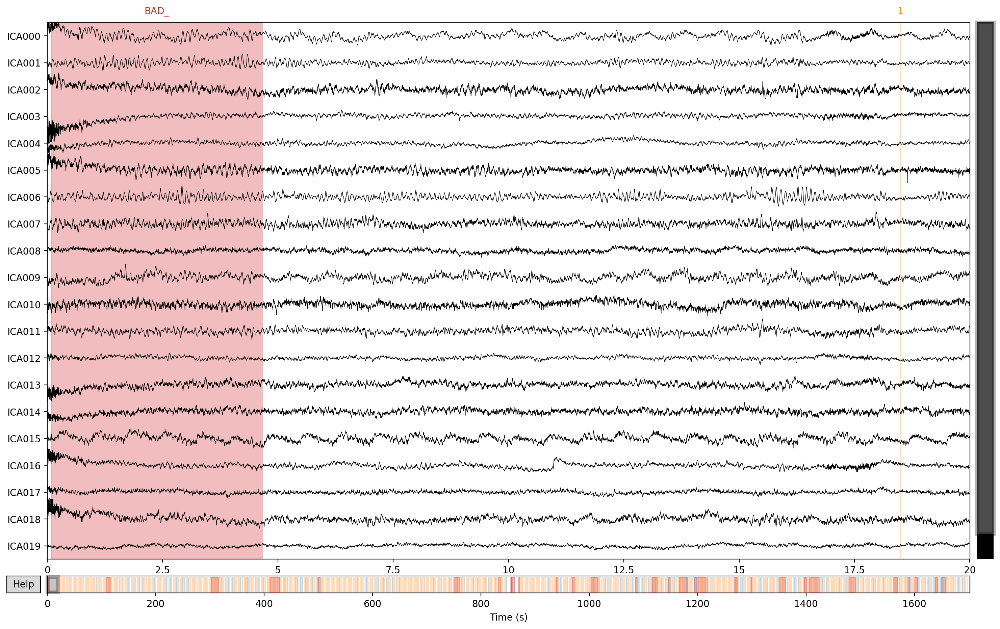

In [16]:
ica.plot_sources(raw_combined)

In [23]:
ica.plot_components()

RuntimeError: No digitization points found.

In [17]:
ica

Method,fastica
Fit parameters,algorithm=parallelfun=logcoshfun_args=Nonemax_iter=800
Fit,16 iterations on raw data (378650 samples)
ICA components,20
Available PCA components,30
Channel types,eeg
ICA components marked for exclusion,—
